In [1]:
import warnings
import gc
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
import ydata_profiling
import calendar
from seaborn import pairplot
from sklearn import (
    ensemble,
    model_selection,
    preprocessing,
    tree
)
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    cross_val_score,
    cross_val_predict
)
from yellowbrick.classifier import (
    ConfusionMatrix,
    ROCAUC
)
from yellowbrick.model_selection import (
    LearningCurve 
)
from imblearn.over_sampling import (
    SMOTE, ADASYN
)
from seaborn import diverging_palette

from pandas_profiling import ProfileReport

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
from IPython.display import Image

from pandas.plotting import scatter_matrix



### Data Import and Profiling


In [3]:
sales = pd.read_csv(r"C:\Users\DWIGHT JIRO\Downloads\supermarket_sales - Sheet1.csv")

In [4]:
sales.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [5]:
profile = ProfileReport(sales)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# dealing with date and time

sales['Date'] = pd.to_datetime(sales['Date'])

sales['Day'] = (sales['Date']).dt.day
sales['Month'] = (sales['Date']).dt.month

sales['Month'] = sales['Month'].apply(lambda x: calendar.month_name[x])

sales['Time'] = pd.to_datetime(sales['Time'])
sales['Hour'] = (sales['Time']).dt.hour

C:\Users\DWIGHT JIRO\AppData\Local\Temp\ipykernel_5312\3295960908.py:10: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  sales['Time'] = pd.to_datetime(sales['Time'])


In [7]:
sales.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Day,Month,Hour
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,2024-12-09 13:08:00,Ewallet,522.83,4.761905,26.1415,9.1,5,January,13
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,2024-12-09 10:29:00,Cash,76.40,4.761905,3.8200,9.6,8,March,10
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,2024-12-09 13:23:00,Credit card,324.31,4.761905,16.2155,7.4,3,March,13
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,2024-12-09 20:33:00,Ewallet,465.76,4.761905,23.2880,8.4,27,January,20
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,2024-12-09 10:37:00,Ewallet,604.17,4.761905,30.2085,5.3,8,February,10


In [8]:
sales.describe()

,Unit price,Quantity,Tax 5%,Total,Date,Time,cogs,gross margin percentage,gross income,Rating,Day,Hour
count,1000.000000,1000.000000,1000.000000,1000.000000,1000,1000,1000.00000,1.000000e+03,1000.000000,1000.00000,1000.000000,1000.000000
mean,55.672130,5.510000,15.379369,322.966749,2019-02-14 00:05:45.600000,2024-12-09 15:24:41.880000,307.58738,4.761905e+00,15.379369,6.97270,15.256000,14.910000
min,10.080000,1.000000,0.508500,10.678500,2019-01-01 00:00:00,2024-12-09 10:00:00,10.17000,4.761905e+00,0.508500,4.00000,1.000000,10.000000
25%,32.875000,3.000000,5.924875,124.422375,2019-01-24 00:00:00,2024-12-09 12:43:00,118.49750,4.761905e+00,5.924875,5.50000,8.000000,12.000000
50%,55.230000,5.000000,12.088000,253.848000,2019-02-13 00:00:00,2024-12-09 15:19:00,241.76000,4.761905e+00,12.088000,7.00000,15.000000,15.000000
75%,77.935000,8.000000,22.445250,471.350250,2019-03-08 00:00:00,2024-12-09 18:15:00,448.90500,4.761905e+00,22.445250,8.50000,23.000000,18.000000
max,99.960000,10.000000,49.650000,1042.650000,2019-03-30 00:00:00,2024-12-09 20:59:00,993.00000,4.761905e+00,49.650000,10.00000,31.000000,20.000000
std,26.494628,2.923431,11.708825,245.885335,NaN,NaN,234.17651,6.131498e-14,11.708825,1.71858,8.693563,3.186857


,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Day,Hour
Unit price,1.000000,0.010778,0.633962,0.633962,0.633962,NaN,0.633962,-0.008778,0.057021,0.008242
Quantity,0.010778,1.000000,0.705510,0.705510,0.705510,NaN,0.705510,-0.015815,-0.043347,-0.007317
Tax 5%,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442,-0.002515,-0.002770
Total,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442,-0.002515,-0.002770
cogs,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442,-0.002515,-0.002770
gross margin percentage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gross income,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442,-0.002515,-0.002770
Rating,-0.008778,-0.015815,-0.036442,-0.036442,-0.036442,NaN,-0.036442,1.000000,-0.007076,-0.030588
Day,0.057021,-0.043347,-0.002515,-0.002515,-0.002515,NaN,-0.002515,-0.007076,1.000000,0.020668
Hour,0.008242,-0.007317,-0.002770,-0.002770,-0.002770,NaN,-0.002770,-0.030588,0.020668,1.000000


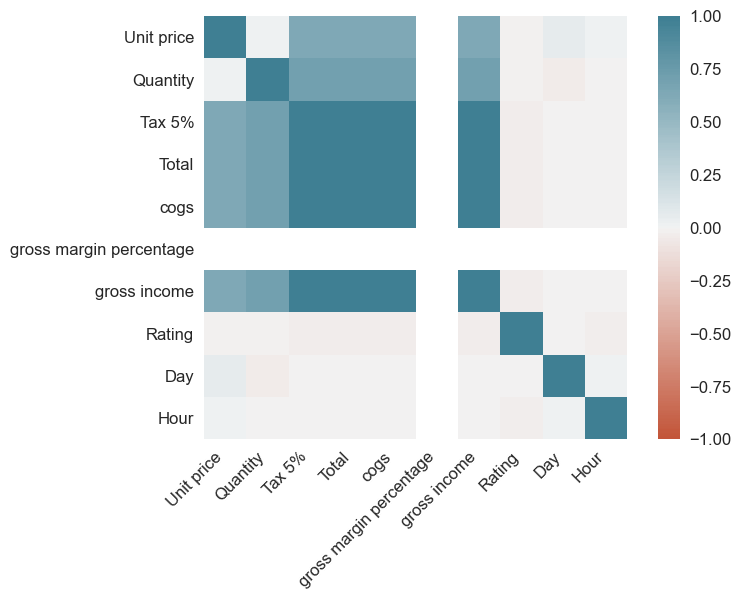

In [9]:
numeric_data = sales.select_dtypes(include=['number', 'float64', 'int64'])

data_corr = numeric_data.corr()

ax = sns.heatmap(
    data_corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200), square=True
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

data_corr


In [10]:
data_corr["Total"].sort_values(ascending=False)

Total                      1.000000
Tax 5%                     1.000000
gross income               1.000000
cogs                       1.000000
Quantity                   0.705510
Unit price                 0.633962
Day                       -0.002515
Hour                      -0.002770
Rating                    -0.036442
gross margin percentage         NaN
Name: Total, dtype: float64

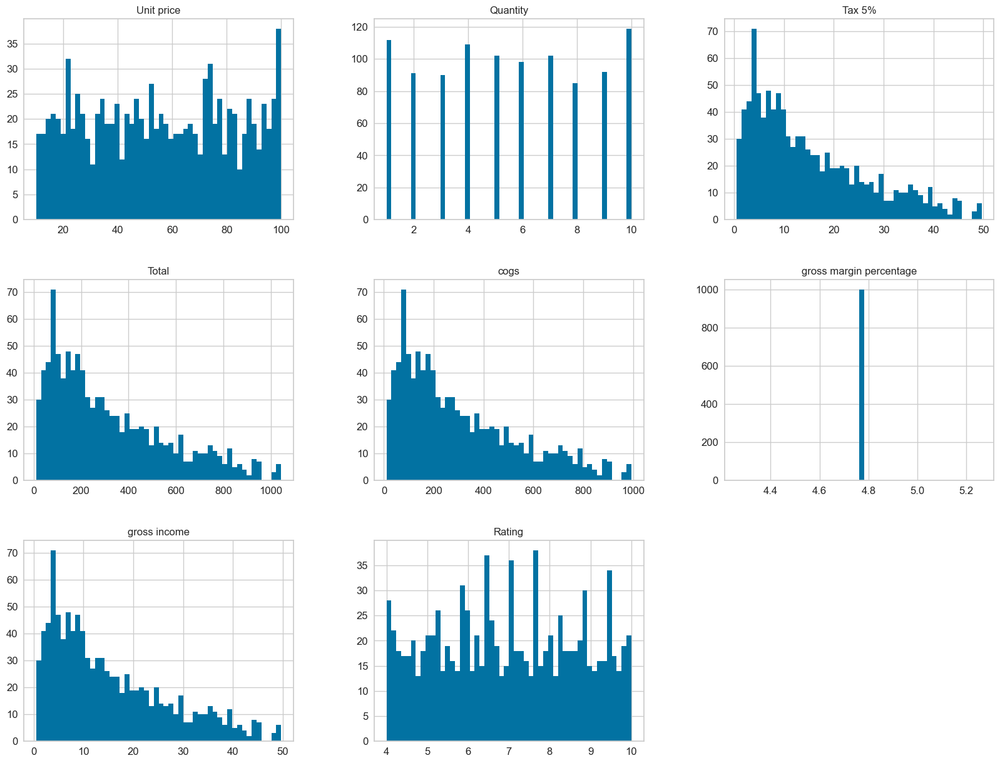

In [11]:
attributes = ["Unit price","Quantity","Tax 5%","Total","cogs","gross margin percentage","gross income","Rating"]
%matplotlib inline
import matplotlib.pyplot as plt
sales[attributes].hist(bins=50, figsize=(20,15))
plt.show()

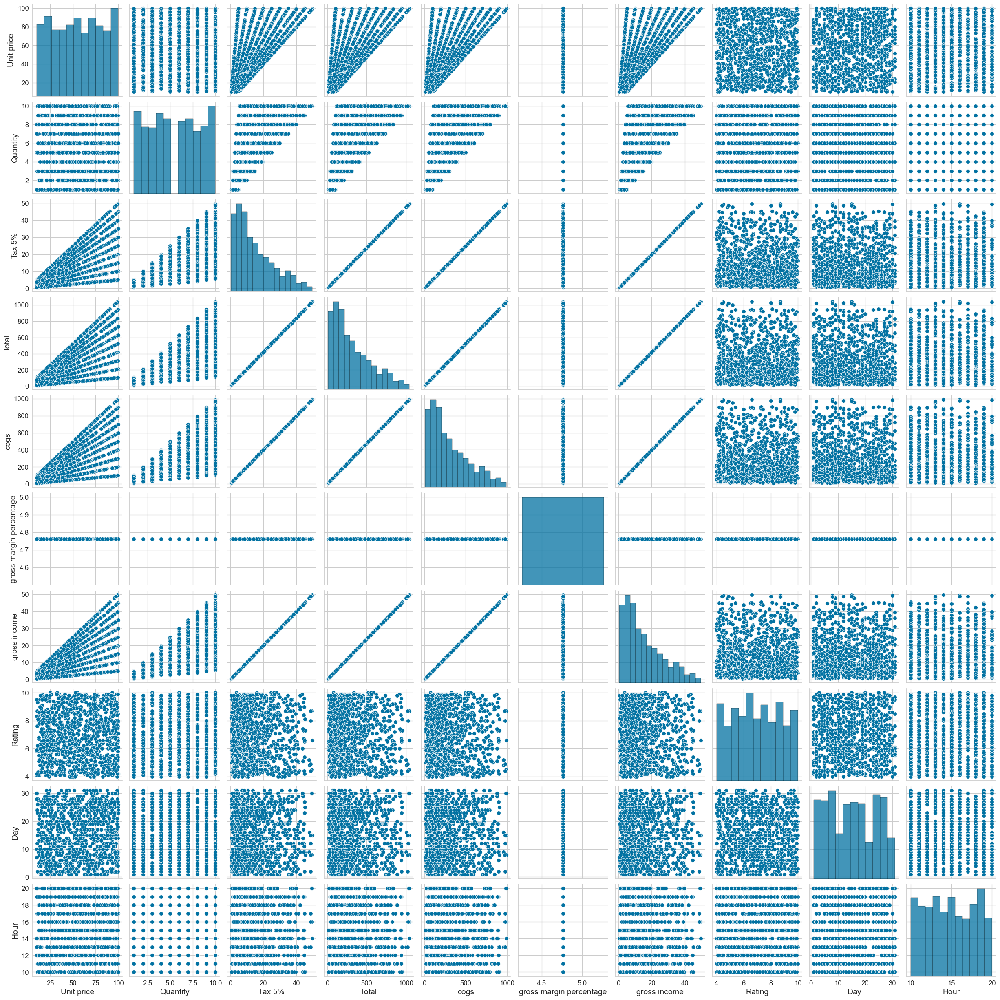

In [12]:
sns.pairplot(sales)

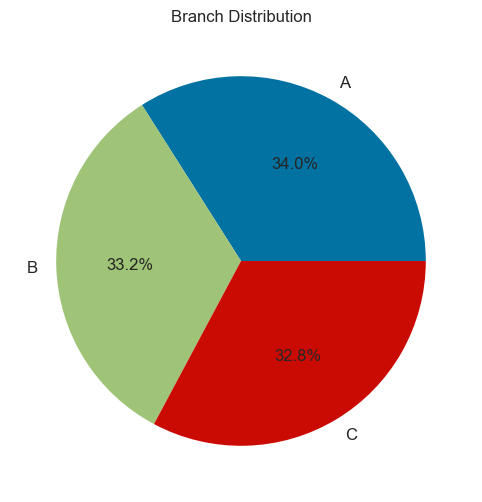

In [13]:
# Assuming 'sales' is your DataFrame
plt.figure(figsize=(12, 6))

# Get the value counts of the 'Branch' column and reset the index
branch = sales['Branch'].value_counts().reset_index()

# Rename the columns for clarity
branch.columns = ['Branch', 'Count']

# Plot the pie chart
plt.pie(branch['Count'], labels=branch['Branch'], autopct='%1.1f%%')
plt.title("Branch Distribution")
plt.show()


#### From the distribution it is clearly observed that the supermarket has maximum number of branch A as compared to B and C.



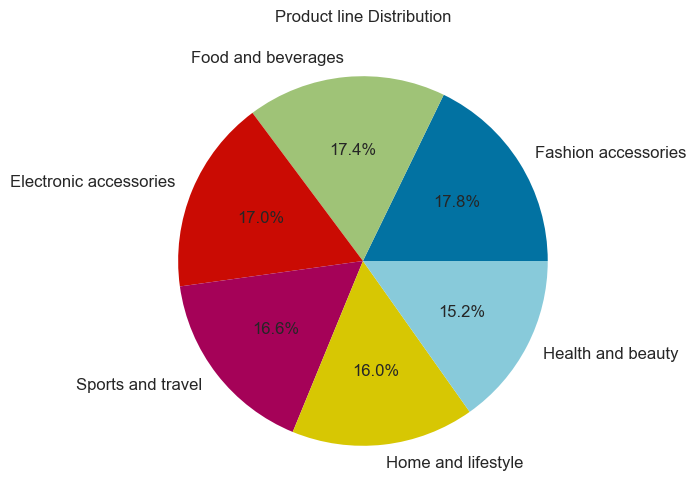

In [14]:

# Assuming 'sales' is your DataFrame
plt.figure(figsize=(12, 6))

# Get the value counts of the 'Product line' column and reset the index
productline = sales['Product line'].value_counts().reset_index()

# Rename the columns for clarity
productline.columns = ['Product line', 'Count']

# Plot the pie chart
plt.pie(productline['Count'], labels=productline['Product line'], autopct='%1.1f%%')
plt.title("Product line Distribution")
plt.show()


#### From the pie chart it was observed that fashion accessories were the most popular product in all the branches, food and beverages stands second and electronic accessories comes third in the product category

<AxesSubplot:xlabel='Gender'>

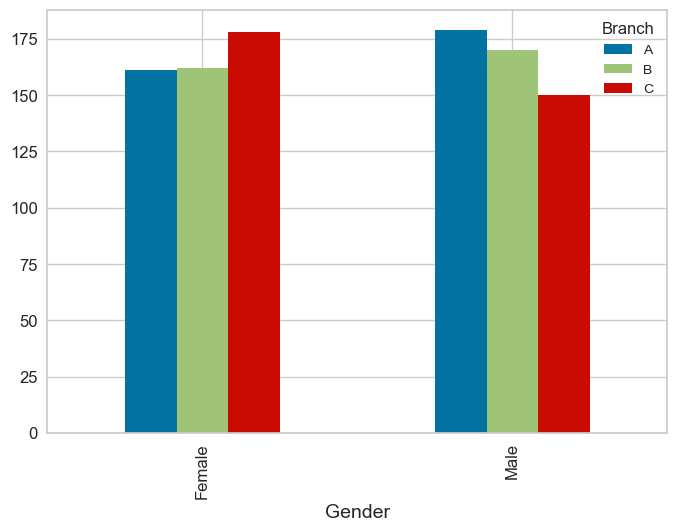

In [15]:
sales.groupby(['Branch','Gender']).size().unstack(0).plot.bar()

#### Higher number of females buy products from Branch C as compared to males who buy most of the products from Branch A and B. This implies that Branch C is more popular among females and Branch A and B are more popular among males.



Text(0.5, 1.0, 'Ratings by Branch')

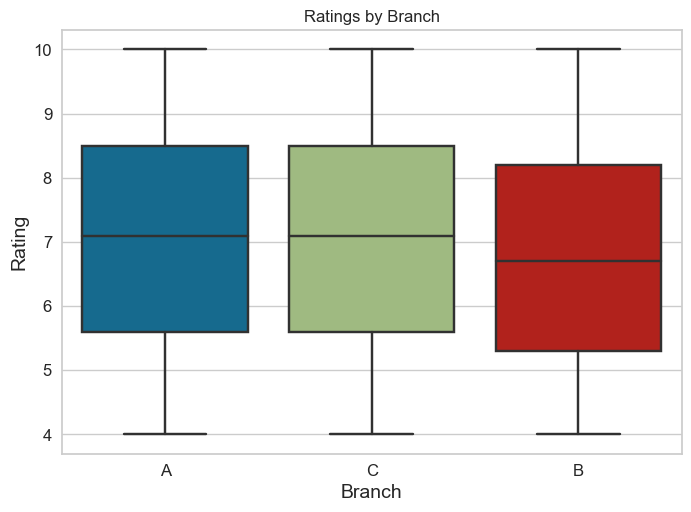

In [16]:
sns.boxplot(x="Branch", y ="Rating" ,data =sales).set_title("Ratings by Branch")

#### Branch B has the lowest rating among all other branches and Branch A and C have equal rating



<AxesSubplot:xlabel='Customer type'>

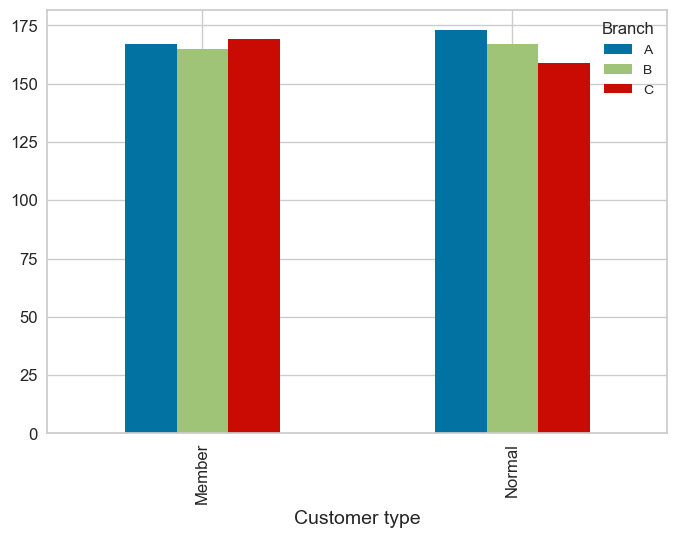

In [17]:
sales.groupby(['Branch','Customer type']).size().unstack(0).plot.bar()


#### The Member customers buy most of their poroducts from Branch C and least from Branch B whereas Normal customers purchase heavily from Branch A and then B but least from Branch C

<AxesSubplot:xlabel='count', ylabel='Product line'>

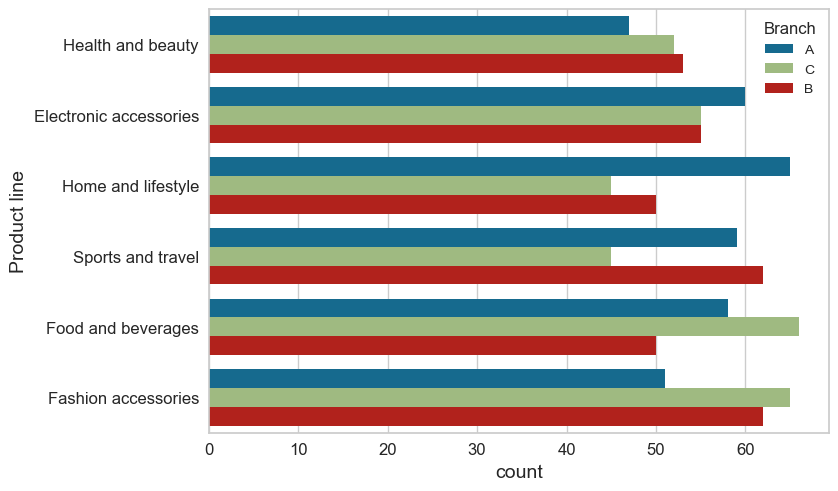

In [18]:
sns.countplot(y='Product line',hue='Branch',data=sales)


#### From the barplot we can observe that in Branch A, Home and lifestyle items are sold the most. In Branch B, Sports and travel and Fashion accessories are mostly sold whereas in Branch C, Food Beverages and Fashion accessories are maximum sold

<AxesSubplot:xlabel='Total', ylabel='Product line'>

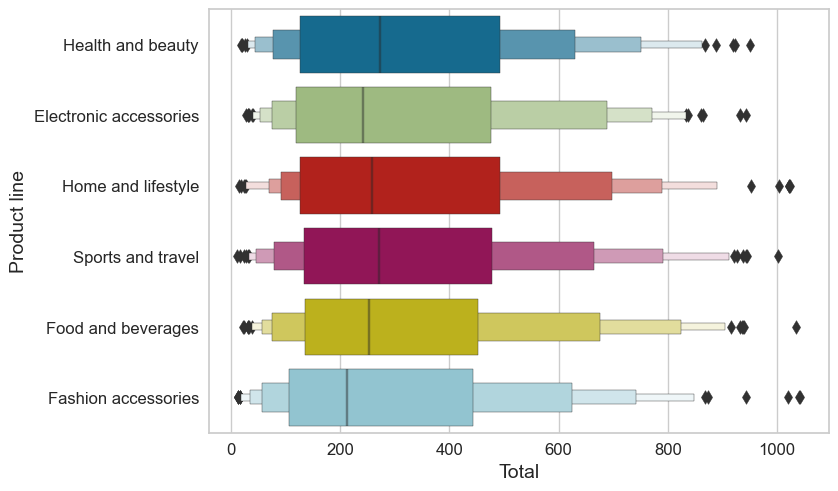

In [19]:
sns.boxenplot(y = 'Product line', x = 'Total', data=sales )


#### From the above visual, Health and Beauty,Sports and travel generate more total sales than Electronic accessories, Home and lifestyle, food and beverages and fashion accessories.

<AxesSubplot:xlabel='Rating', ylabel='Product line'>

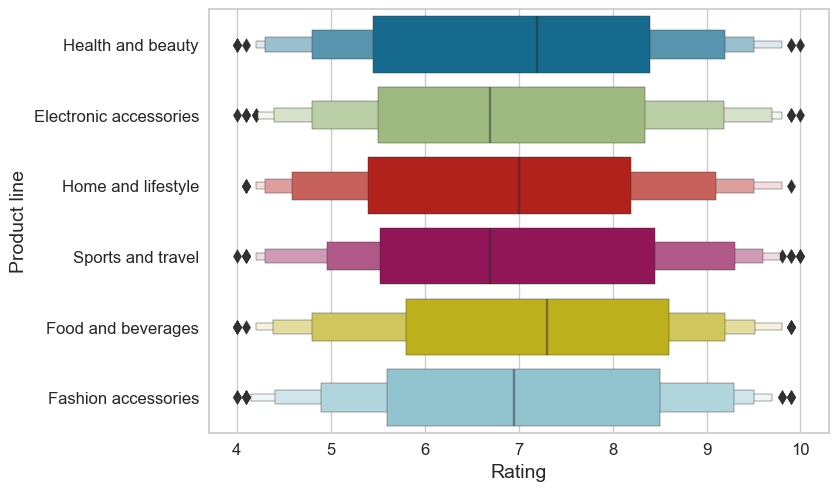

In [20]:
sns.boxenplot(y = 'Product line', x = 'Rating', data=sales )


#### Health and Beauty and food and beverages have higher rating as compared to other products. The least rating was observed for electronic accessories and sport and travel items

<AxesSubplot:xlabel='Total', ylabel='Product line'>

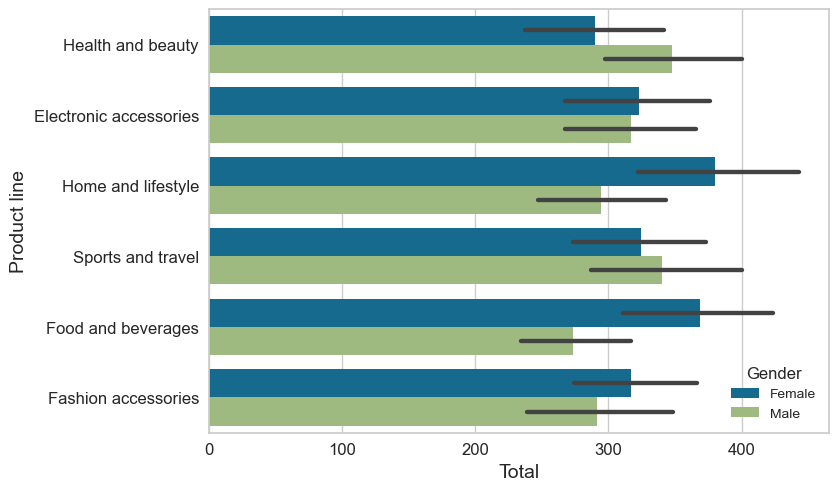

In [21]:
sns.barplot(x='Total',hue='Gender',y = 'Product line',data=sales)


#### Females prefer tot shop for Home and lifestyle items and generate the maximum sales of around 380 dollars whereas males are more inclined to shop for Health and beauty products and generated maximum sales of around 350 dollars

<AxesSubplot:xlabel='Quantity', ylabel='Product line'>

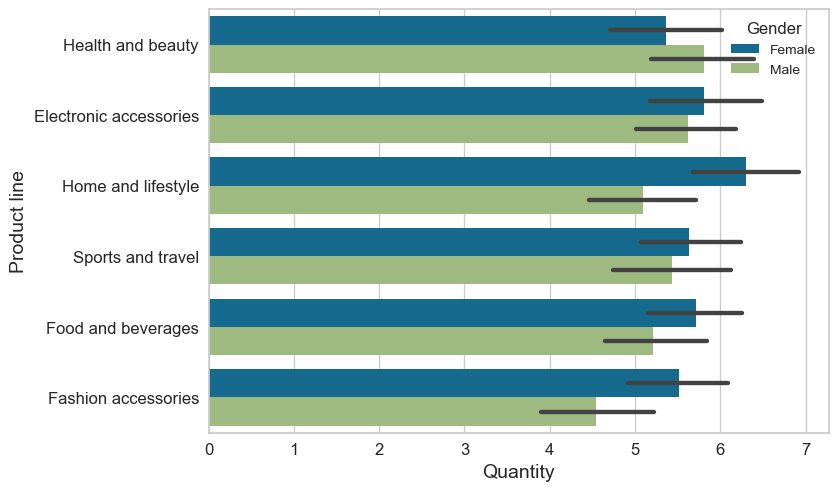

In [22]:
sns.barplot(x='Quantity',hue='Gender',y = 'Product line',data=sales)


#### As observed previously in total sales, Females prefer to shop for Home and lifestyle items and that is why they purchase maximum quantity(6.3) of this product whereas males are more inclined to shop for Health and beauty products and they purchased maximum quantity of around 5.7

<AxesSubplot:xlabel='Unit price', ylabel='Product line'>

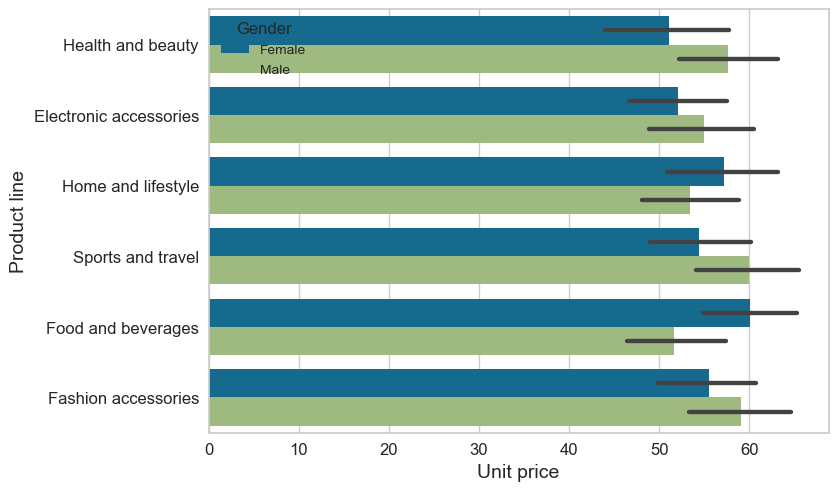

In [23]:
sns.barplot(x='Unit price',hue='Gender',y = 'Product line',data=sales)


#### This depicts that males and females don't want to compromise on the quality of sports and travel products as well as food and beverages products, so they are buying these products in maximum even though these products have higher unit price.

<AxesSubplot:xlabel='Total', ylabel='Product line'>

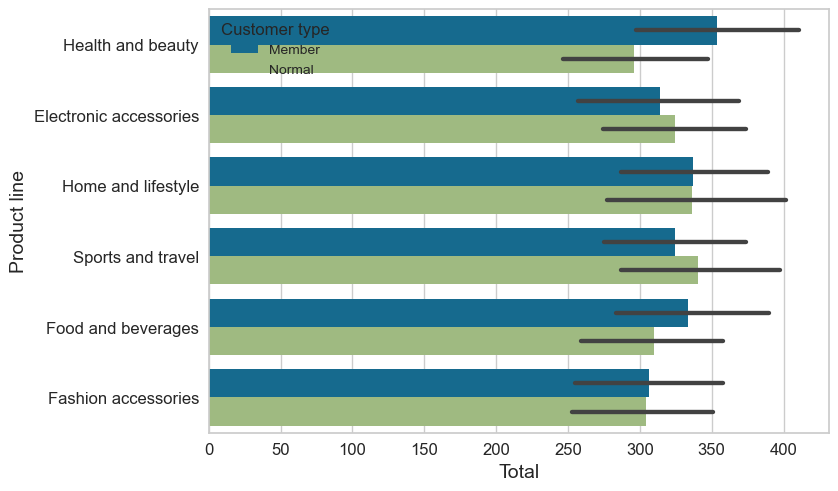

In [24]:
sns.barplot(x='Total',hue='Customer type',y = 'Product line',data=sales)


#### Members prefer to buy more of health and beauty products and generated maximum sales of about 350 dollars whereas Normal customers prefer sports and travel products and generated maximum sales of about 340 dollars

<AxesSubplot:xlabel='Quantity', ylabel='Product line'>

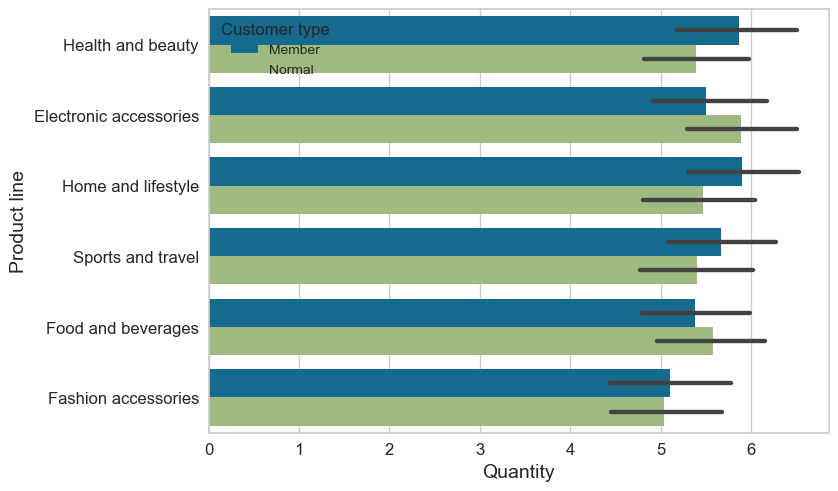

In [25]:
sns.barplot(x='Quantity',hue='Customer type',y = 'Product line',data=sales)


#### Members prefer to buy more quantity of health and beauty products and home and lifestyle products whereas Normal customers prefer electronic accessories

<AxesSubplot:xlabel='Unit price', ylabel='Product line'>

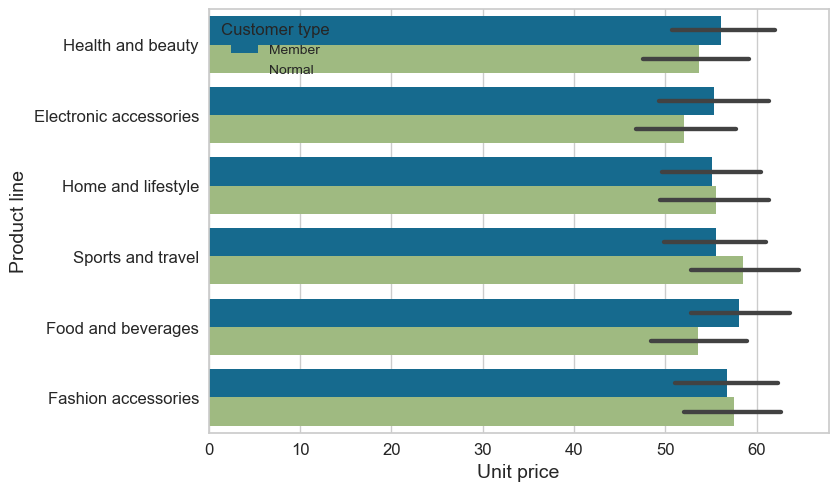

In [26]:
#Price of products segregated by Customer type
sns.barplot(x='Unit price',hue='Customer type',y = 'Product line',data=sales)

#### This depicts that members and normal customers don't want to compromise on the quality of sports and travel products as well as food and beverages products, so they are buying these products in maximum even though these products have higher unit price.

<AxesSubplot:xlabel='Total', ylabel='Product line'>

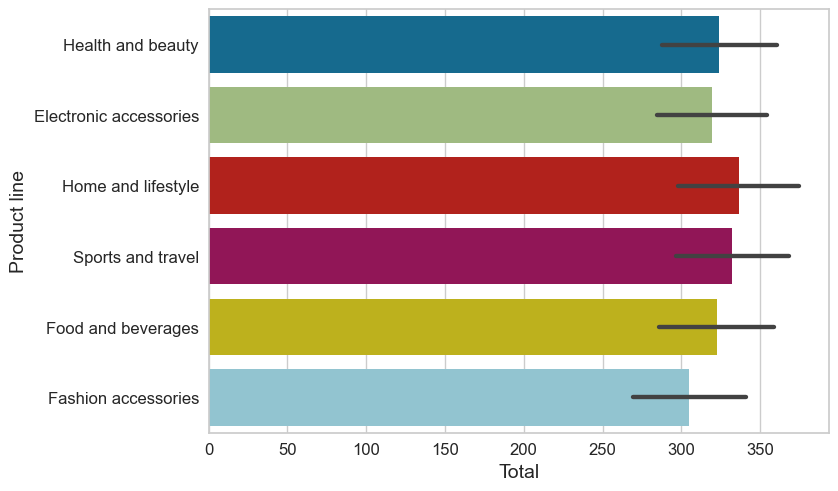

In [27]:
#Total sales of products per branch
sns.barplot(x='Total',y = 'Product line',data=sales)

#### In Branch A the maximum sales are generated by home and lifestyle products, in Branch B, Health and beauty products generates the maximum sales and in Branch C food and beverages generated maximum sales

<AxesSubplot:xlabel='Total', ylabel='Product line'>

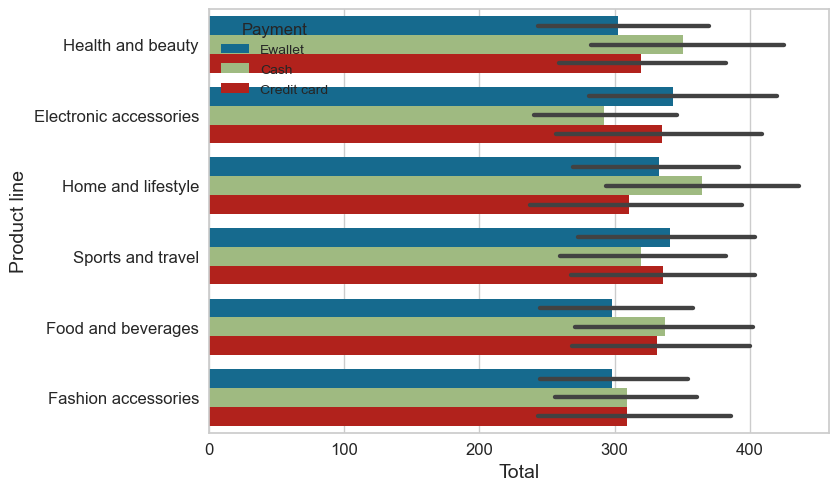

In [28]:
#Total sales of products for each payment type
sns.barplot(x='Total',hue='Payment',y = 'Product line',data=sales)

#### Mostly customers purchase electronic accessories using e-waalet which generates maximum sales of about 350 dollars. Customers prefer to purchase home and lifestyle products through cash and generates maximum sales of about 360 dollars. The credit card is mostly famous for the shopping of electronic accessories and sports and travel and generates maximum sales for these products due to credit card purchase.

<AxesSubplot:xlabel='Total', ylabel='Branch'>

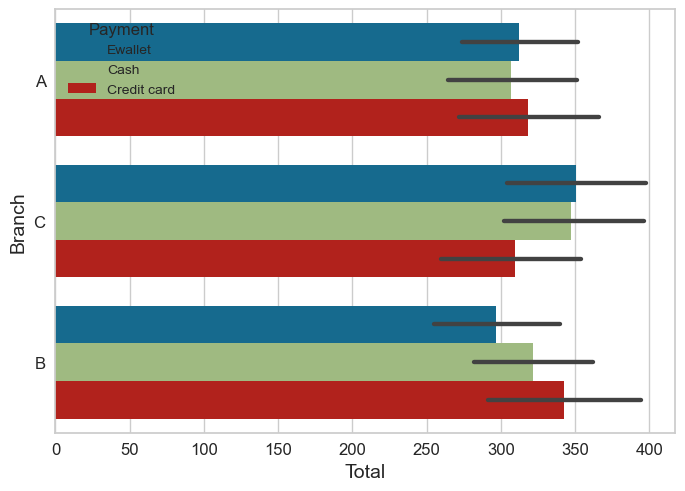

In [29]:
sns.barplot(x='Total',hue='Payment',y = 'Branch',data=sales)


#### In Branch A, the maximum sales are generated through Credit card payments, In Branch B, it is through E-wallet payments and in Branch C it is through credit card payments

<AxesSubplot:xlabel='Gender', ylabel='Total'>

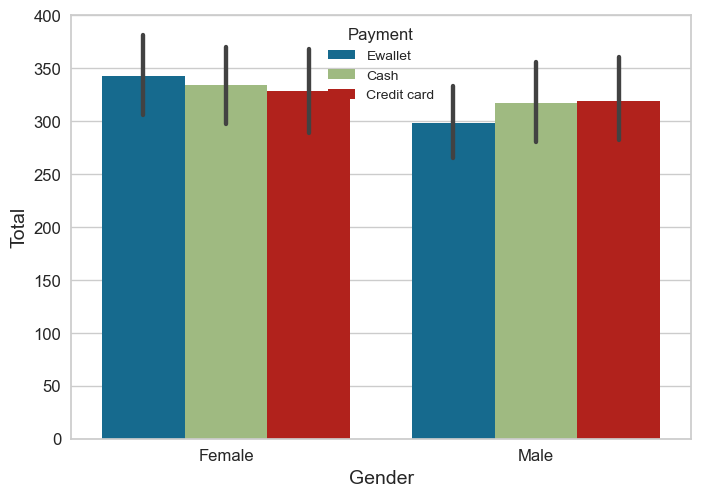

In [30]:
#Sales generated by Gender through payment types
sns.barplot(y='Total',hue='Payment',x = 'Gender',data=sales)

#### Females prefer to purchase itmes using e-wallet and generate maximum sales of about 348 dollars whereas males prefer to shop by credit cards and generate maximim sales of about 330 dollars

<AxesSubplot:xlabel='Customer type', ylabel='Total'>

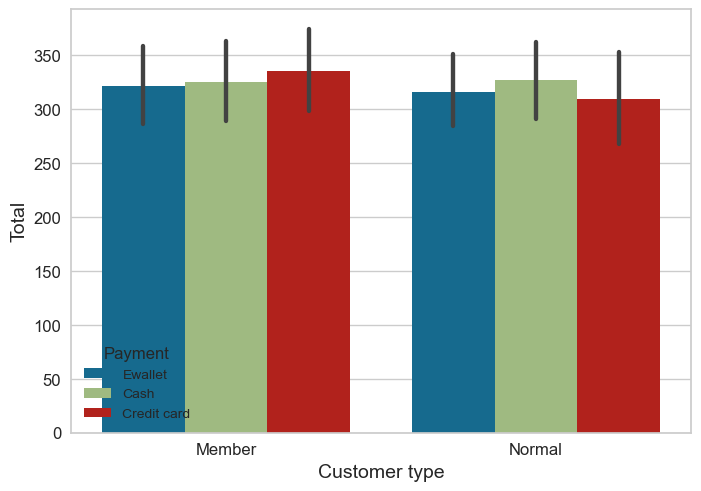

In [31]:
#Sales generated by Customer Type through payment types

sns.barplot(y='Total',hue='Payment',x = 'Customer type',data=sales)

#### Members prefer to purchase itmes using credit card and generate maximum sales of about 345 dollars whereas normal customers prefer to shop by cash and generate maximim sales of about 330 dollars

Text(0.5, 1.0, 'Hourly sales')

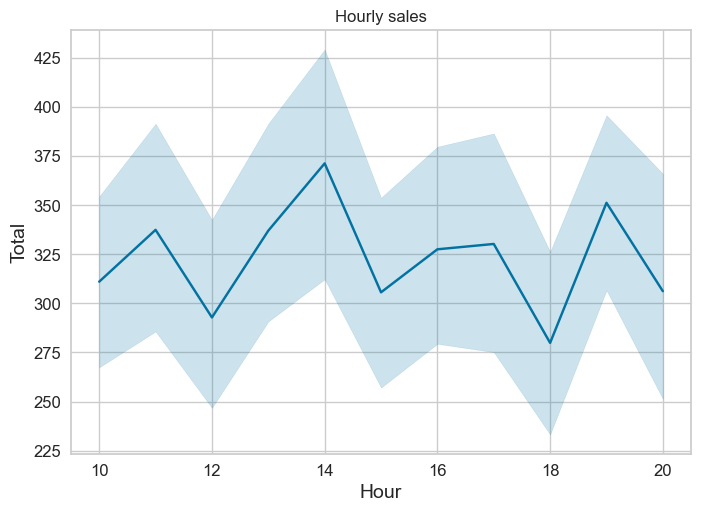

In [32]:
#Hourly Sales

sns.lineplot(x="Hour",  y = 'Total',data =sales).set_title("Hourly sales")

Text(0.5, 1.0, 'Daily sales')

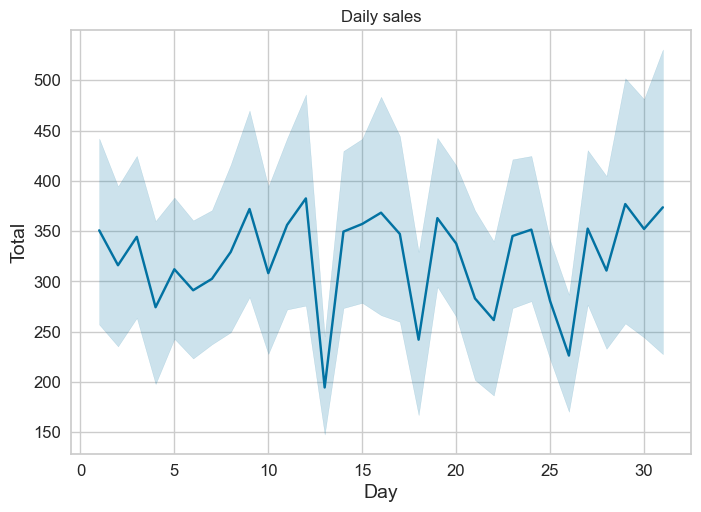

In [33]:
#Daily Sales
sns.lineplot(x="Day",  y = 'Total',data =sales).set_title("Daily sales")

#### Most of the sale sare generates in around 28 days



Text(0.5, 1.0, 'Monthly sales')

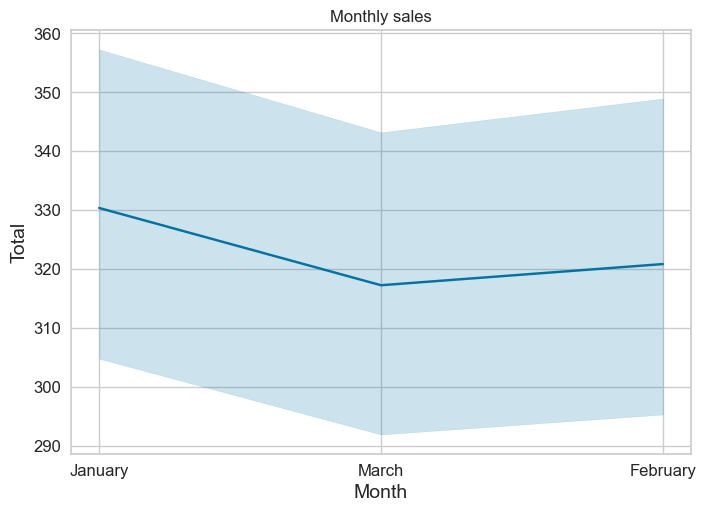

In [34]:
sns.lineplot(x="Month",  y = 'Total',data =sales).set_title("Monthly sales")


#### Maximum sales are generated in the month of January with a big drop in March and slight increase in February



# Data Preparation


In [35]:
sales_clean = sales.drop(columns=["Invoice ID","Date","Time","gross margin percentage"])


In [36]:
sales_clean.head()


,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Payment,cogs,gross income,Rating,Day,Month,Hour
0,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,Ewallet,522.83,26.1415,9.1,5,January,13
1,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,Cash,76.40,3.8200,9.6,8,March,10
2,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,Credit card,324.31,16.2155,7.4,3,March,13
3,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,Ewallet,465.76,23.2880,8.4,27,January,20
4,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,Ewallet,604.17,30.2085,5.3,8,February,10


In [37]:
binary_feature = sales_clean.nunique()[sales_clean.nunique() == 2].keys().tolist()


In [38]:
numeric_feat = sales_clean.drop(columns = ["Branch","City","Customer type","Gender","Product line","Payment","Month"])


In [39]:
numeric_feat.columns


Index(['Unit price', 'Quantity', 'Tax 5%', 'Total', 'cogs', 'gross income',
       'Rating', 'Day', 'Hour'],
      dtype='object')

In [40]:
cat_feat = sales_clean[["Branch","City","Customer type","Gender","Product line","Payment","Month"]]


In [41]:
cat_feat.columns


Index(['Branch', 'City', 'Customer type', 'Gender', 'Product line', 'Payment',
       'Month'],
      dtype='object')

In [42]:
# Feature Engineering by dummyfying the binary and categorical variables
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in binary_feature:
    sales_clean[i] = le.fit_transform(sales_clean[i])

In [43]:
sales_clean = pd.get_dummies(sales_clean)


In [44]:
sales_clean.head()


,Customer type,Gender,Unit price,Quantity,Tax 5%,Total,cogs,gross income,Rating,Day,...,Product line_Food and beverages,Product line_Health and beauty,Product line_Home and lifestyle,Product line_Sports and travel,Payment_Cash,Payment_Credit card,Payment_Ewallet,Month_February,Month_January,Month_March
0,0,0,74.69,7,26.1415,548.9715,522.83,26.1415,9.1,5,...,False,True,False,False,False,False,True,False,True,False
1,1,0,15.28,5,3.8200,80.2200,76.40,3.8200,9.6,8,...,False,False,False,False,True,False,False,False,False,True
2,1,1,46.33,7,16.2155,340.5255,324.31,16.2155,7.4,3,...,False,False,True,False,False,True,False,False,False,True
3,0,1,58.22,8,23.2880,489.0480,465.76,23.2880,8.4,27,...,False,True,False,False,False,False,True,False,True,False
4,1,1,86.31,7,30.2085,634.3785,604.17,30.2085,5.3,8,...,False,False,False,True,False,False,True,True,False,False


,Customer type,Gender,Unit price,Quantity,Tax 5%,Total,cogs,gross income,Rating,Day,...,Product line_Food and beverages,Product line_Health and beauty,Product line_Home and lifestyle,Product line_Sports and travel,Payment_Cash,Payment_Credit card,Payment_Ewallet,Month_February,Month_January,Month_March
Customer type,1.000000,0.039996,-0.020238,-0.016763,-0.019670,-0.019670,-0.019670,-0.019670,0.018889,0.034124,...,-0.036011,0.017559,-0.015494,-0.020608,0.018289,-0.069946,0.049835,-0.048730,0.018225,0.028799
Gender,0.039996,1.000000,0.015445,-0.074258,-0.049451,-0.049451,-0.049451,-0.049451,0.004800,0.051157,...,-0.014909,0.067695,0.006328,-0.025984,-0.023813,-0.031061,0.054042,-0.053082,0.001474,0.049835
Unit price,-0.020238,0.015445,1.000000,0.010778,0.633962,0.633962,0.633962,0.633962,-0.008778,0.057021,...,0.005836,-0.013072,-0.005854,0.022257,0.029721,-0.032415,0.001865,0.023901,0.012437,-0.035601
Quantity,-0.016763,-0.074258,0.010778,1.000000,0.705510,0.705510,0.705510,0.705510,-0.015815,-0.043347,...,-0.006084,0.015709,0.027446,0.004912,0.000403,0.006203,-0.006443,-0.011565,0.018258,-0.007163
Tax 5%,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
Total,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
cogs,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
gross income,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
Rating,0.018889,0.004800,-0.008778,-0.015815,-0.036442,-0.036442,-0.036442,-0.036442,1.000000,-0.007076,...,0.037546,0.007540,-0.034351,-0.014658,-0.001114,0.011935,-0.010509,0.037842,0.019271,-0.055945
Day,0.034124,0.051157,0.057021,-0.043347,-0.002515,-0.002515,-0.002515,-0.002515,-0.007076,1.000000,...,-0.002897,0.017338,-0.048331,-0.017784,0.021304,-0.035954,0.013722,-0.105823,0.154916,-0.053339


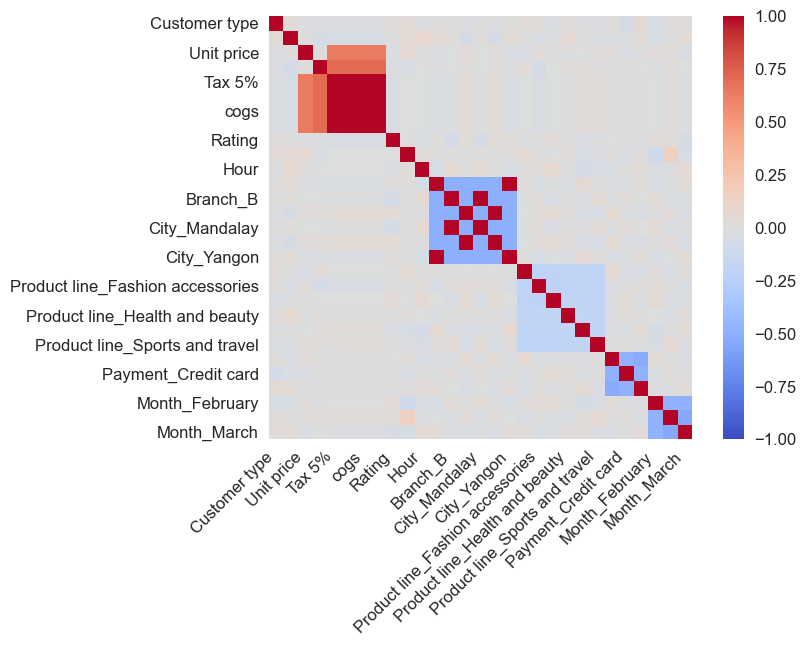

In [45]:
data_corr2 = sales_clean.corr()

ax = sns.heatmap(
   data_corr2, 
    vmin=-1, vmax=1, center=0,
    cmap = "coolwarm",square=True,
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

data_corr2

In [46]:
data_corr2["Total"].sort_values(ascending=False)


Total                                  1.000000
Tax 5%                                 1.000000
gross income                           1.000000
cogs                                   1.000000
Quantity                               0.705510
Unit price                             0.633962
Branch_C                               0.040176
City_Naypyitaw                         0.040176
Product line_Home and lifestyle        0.024276
Month_January                          0.022216
Product line_Sports and travel         0.016517
Payment_Cash                           0.009474
Payment_Credit card                    0.002852
Product line_Health and beauty         0.001165
Product line_Food and beverages       -0.000551
Day                                   -0.002515
Hour                                  -0.002770
Month_February                        -0.005663
Product line_Electronic accessories   -0.006140
Branch_B                              -0.008876
City_Mandalay                         -0

In [47]:
sales_clean = sales_clean.drop(columns = ["Tax 5%","cogs","gross income","City_Mandalay","City_Naypyitaw","City_Yangon"])


In [48]:
sales_clean.columns


Index(['Customer type', 'Gender', 'Unit price', 'Quantity', 'Total', 'Rating',
       'Day', 'Hour', 'Branch_A', 'Branch_B', 'Branch_C',
       'Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel', 'Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
      dtype='object')

# Training,Tuning and Building Model


In [49]:
# Creating X and Y variables
X = sales_clean.drop(columns=["Total"])
y = sales_clean["Total"]

In [50]:
#Splitting dataset into training and testing
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=0)

In [51]:
# Standardising training and testing dataset
from sklearn.preprocessing import StandardScaler
standardizer = StandardScaler()
X_train = standardizer.fit_transform(X_train)
X_train = pd.DataFrame(X_train,columns = X.columns)
X_test = standardizer.transform(X_test)
X_test = pd.DataFrame(X_test,columns = X.columns)

# Feature Selection

### Lasso Feature Selection Method

In [52]:
# Lasso Feature Selection Method

from sklearn.linear_model import Lasso 
model = Lasso(alpha=0.04,random_state=0)
model.fit(X_train,y_train)
model_ldf= pd.DataFrame(list(zip(X_train.columns,model.coef_)),columns=['predictor','coefficient'])
model_ldf

,predictor,coefficient
0,Customer type,1.370618
1,Gender,-2.178444
2,Unit price,151.990204
3,Quantity,171.665796
4,Rating,-7.249468
5,Day,-3.311047
6,Hour,-2.034736
7,Branch_A,-1.097904
8,Branch_B,-0.000000
9,Branch_C,3.924618


### Recursive Feature Elimination Method


In [53]:
#Recursive Feature Elimination Method
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0, max_depth = 6)
rfe = RFE(rf, n_features_to_select=10)
model_rfe = rfe.fit(X_train, y_train)
model_rfe_df = pd.DataFrame(list(zip(X_train.columns,model_rfe.ranking_)), columns = ['predictor','ranking'])
model_rfe_df

,predictor,ranking
0,Customer type,5
1,Gender,8
2,Unit price,1
3,Quantity,1
4,Rating,1
5,Day,1
6,Hour,1
7,Branch_A,1
8,Branch_B,1
9,Branch_C,1


### Random Forest Feature Elimination



In [54]:
# Random Forest Feature Elimination
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0, max_depth = 6)
model_rf = rf.fit(X_train,y_train)
model_rf.feature_importances_
model_rf_df = pd.DataFrame(list(zip(X.columns,model_rf.feature_importances_)),columns=['predictor','feature importance'])
model_rf_df

,predictor,feature importance
0,Customer type,0.000018
1,Gender,0.000010
2,Unit price,0.481490
3,Quantity,0.517658
4,Rating,0.000282
5,Day,0.000108
6,Hour,0.000129
7,Branch_A,0.000038
8,Branch_B,0.000025
9,Branch_C,0.000036


In [55]:
#Removing useless predictors from training & testing dataset which were depicted from lasso and RFE feature selection methods
X_train = X_train.drop(columns = ["Payment_Credit card","Product line_Food and beverages","Product line_Electronic accessories","Product line_Health and beauty"])
X_test = X_test.drop(columns = ["Payment_Credit card","Product line_Food and beverages","Product line_Electronic accessories","Product line_Health and beauty"])

# Applying Models


### Linear Regression



In [56]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
model_lm = lm.fit(X_train,y_train)
y_test_pred = model_lm.predict(X_test)

from sklearn.metrics import mean_squared_error
lin_mse = mean_squared_error(y_test,y_test_pred)
print("Linear Regression Model MSE: {}".format(lin_mse))
lin_rmse = np.sqrt(lin_mse)
print("Linear Regression Model RMSE: {}".format(lin_rmse))

from sklearn.metrics import mean_absolute_error
lin_mae = mean_absolute_error(y_test,y_test_pred)
print("Linear Regression Model MAE: {}".format(lin_mae))

Linear Regression Model MSE: 6565.898456820022
Linear Regression Model RMSE: 81.03023174605896
Linear Regression Model MAE: 62.19278980358795


In [57]:

from sklearn.model_selection import cross_val_score
lin_scores = cross_val_score(estimator=model_lm,X=X_train,y=y_train,scoring="neg_mean_squared_error",cv=10)
lin_rmse_scores = np.sqrt(-lin_scores)

def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

display_scores(lin_rmse_scores)

Scores: [97.47215482 75.54971181 91.35244647 77.94035251 77.36495184 78.77150252
 85.72213287 79.28052135 84.71849784 85.97553476]
Mean: 83.41478067866697
Standard deviation: 6.642880048638863


### Random Forest Model

In [58]:
 #Random Forest Model

#Model Built

from sklearn.ensemble import RandomForestRegressor
rf2 = RandomForestRegressor(random_state=0)
modelRF = rf2.fit(X_train,y_train)
y_test_pred2 = modelRF.predict(X_test)
mse_rf = mean_squared_error(y_test,y_test_pred2)
print("Random Forest MSE:{}".format(mse_rf))
rf_rmse = np.sqrt(mse_rf)
print("Random Forest RSE:{}".format(rf_rmse))
rf_mae = mean_absolute_error(y_test,y_test_pred2)
print("Random Forest Model MAE: {}".format(rf_mae))

Random Forest MSE:142.93076974968747
Random Forest RSE:11.955365730486353
Random Forest Model MAE: 7.869458799999993


In [59]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
rf3=RandomForestRegressor(random_state=0)
param_grid = { 
    'n_estimators': [100,200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,6,8,10,12],
}

CV_rf3 = GridSearchCV(estimator=rf3, param_grid=param_grid, cv= 10)
rf3_result = CV_rf3.fit(X_train, y_train)
CV_rf3.cv_results_
df_rf3 = pd.DataFrame(CV_rf3.cv_results_)
df_rf3


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_n_estimators,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.143160,0.003406,0.004592,0.000484,4,auto,100,"{'max_depth': 4, 'max_features': 'auto', 'n_es...",0.968629,0.976859,...,0.970444,0.973389,0.968634,0.965111,0.979117,0.973220,0.984058,0.974243,0.006047,9
1,0.281148,0.001723,0.007569,0.000444,4,auto,200,"{'max_depth': 4, 'max_features': 'auto', 'n_es...",0.968308,0.976649,...,0.971064,0.972000,0.966822,0.963967,0.980285,0.972441,0.984010,0.973944,0.006665,10
2,0.098229,0.001563,0.004639,0.000449,4,sqrt,100,"{'max_depth': 4, 'max_features': 'sqrt', 'n_es...",0.599516,0.655146,...,0.662702,0.689470,0.699211,0.588191,0.688650,0.651333,0.675631,0.661865,0.038391,29
3,0.193837,0.001791,0.007575,0.000485,4,sqrt,200,"{'max_depth': 4, 'max_features': 'sqrt', 'n_es...",0.628942,0.670309,...,0.670363,0.706178,0.701864,0.611198,0.701436,0.660491,0.698394,0.676729,0.033489,27
4,0.097616,0.000766,0.004596,0.000478,4,log2,100,"{'max_depth': 4, 'max_features': 'log2', 'n_es...",0.599516,0.655146,...,0.662702,0.689470,0.699211,0.588191,0.688650,0.651333,0.675631,0.661865,0.038391,29
5,0.193540,0.001332,0.008288,0.001261,4,log2,200,"{'max_depth': 4, 'max_features': 'log2', 'n_es...",0.628942,0.670309,...,0.670363,0.706178,0.701864,0.611198,0.701436,0.660491,0.698394,0.676729,0.033489,27
6,0.179872,0.002143,0.004632,0.000459,6,auto,100,"{'max_depth': 6, 'max_features': 'auto', 'n_es...",0.992867,0.996843,...,0.990022,0.994552,0.994241,0.991729,0.994182,0.995593,0.995927,0.994246,0.002066,7
7,0.359750,0.007459,0.008282,0.000455,6,auto,200,"{'max_depth': 6, 'max_features': 'auto', 'n_es...",0.992484,0.996867,...,0.989560,0.994422,0.993871,0.991748,0.994658,0.995604,0.995868,0.994189,0.002225,8
8,0.110661,0.003364,0.004888,0.000299,6,sqrt,100,"{'max_depth': 6, 'max_features': 'sqrt', 'n_es...",0.798145,0.803087,...,0.801327,0.797118,0.833593,0.769193,0.841790,0.791218,0.816246,0.806845,0.019999,25
9,0.217827,0.003525,0.008229,0.000402,6,sqrt,200,"{'max_depth': 6, 'max_features': 'sqrt', 'n_es...",0.807154,0.809275,...,0.805231,0.819108,0.814696,0.768920,0.834789,0.790357,0.814889,0.809228,0.017779,23


In [60]:
rf3_result.best_params_


{'max_depth': 10, 'max_features': 'auto', 'n_estimators': 100}

In [61]:
model_rfr = RandomForestRegressor(max_depth=10,max_features='auto',n_estimators=100)
model_rfr.fit(X_train, y_train)
y_pred_rfr = model_rfr.predict(X_test)
mse_rf2 = mean_squared_error(y_test,y_pred_rfr)
print("Random Forest MSE:{}".format(mse_rf2))
rf2_rmse = np.sqrt(mse_rf2)
print("Random Forest RSE:{}".format(rf2_rmse))
rf2_mae = mean_absolute_error(y_test,y_pred_rfr)
print("Random Forest Model MAE: {}".format(rf2_mae))

Random Forest MSE:155.23032516364228
Random Forest RSE:12.459146245375013
Random Forest Model MAE: 8.240739209348305


#### Feature Importance



In [62]:
# Feature Importance

feature_importances_rfr = rf3_result.best_estimator_.feature_importances_
feature_importances_rfr

array([8.63114011e-05, 1.00252043e-04, 4.81591268e-01, 5.15295644e-01,
       7.99196928e-04, 5.25015467e-04, 4.98689740e-04, 8.89520142e-05,
       9.36400083e-05, 1.76285753e-04, 8.46822855e-05, 8.04609876e-05,
       8.18223136e-05, 8.87436597e-05, 8.55113199e-05, 8.63759433e-05,
       9.78767251e-05, 1.39271113e-04])

In [63]:
def plot_feature_importance(importance,names,model_type):

    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + 'FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

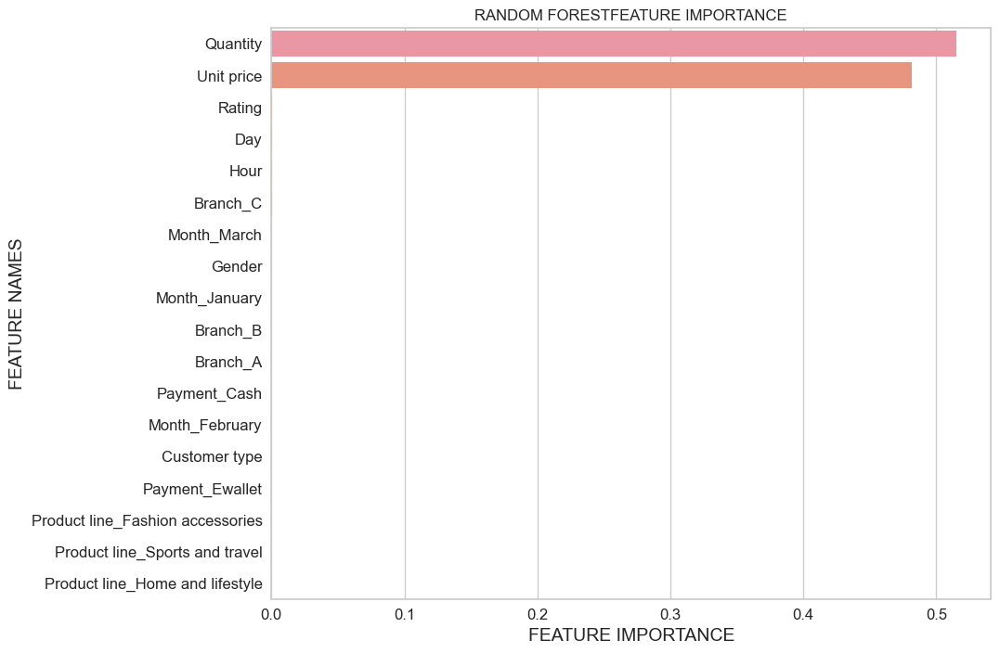

In [64]:
plot_feature_importance(rf3_result.best_estimator_.feature_importances_,X_train.columns,'RANDOM FOREST')


#### Gradient Boosting Model



In [65]:
from sklearn.ensemble import GradientBoostingRegressor
gbt = GradientBoostingRegressor(random_state=0)
model_gbt = gbt.fit(X_train,y_train)
y_pred_gbt = model_gbt.predict(X_test)
mse_gbt = mean_squared_error(y_test,y_pred_gbt)
print("GBT Model MSE:{}".format(mse_gbt))
gbt_rmse = np.sqrt(mse_gbt)
print("GBT Model RMSE:{}".format(gbt_rmse))
gbt_mae = mean_absolute_error(y_test,y_pred_gbt)
print("GBT Model MAE: {}".format(gbt_mae))

GBT Model MSE:113.29239311636935
GBT Model RMSE:10.643889942890679
GBT Model MAE: 7.501795136962137


In [66]:
#fine Tuning the model
from sklearn.ensemble import GradientBoostingRegressor
gbt = GradientBoostingRegressor(random_state=0)
parameters = {
    "learning_rate": [0.01, 0.025, 0.05,],
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],
    "n_estimators":[200,500]
    }

clf = GridSearchCV(estimator=gbt, param_grid=parameters, cv=10,verbose = 0)
gbt_result = clf.fit(X_train, y_train)
clf.cv_results_
df_gbt = pd.DataFrame(clf.cv_results_)
df_gbt

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_max_features,param_n_estimators,params,split0_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.078394,0.006381,0.001848,0.000448,0.01,3,log2,200,"{'learning_rate': 0.01, 'max_depth': 3, 'max_f...",0.686939,...,0.720591,0.731142,0.714574,0.649770,0.726150,0.697377,0.713067,0.707705,0.023380,35
1,0.185639,0.002588,0.002403,0.000482,0.01,3,log2,500,"{'learning_rate': 0.01, 'max_depth': 3, 'max_f...",0.888492,...,0.918822,0.918320,0.908756,0.882477,0.914381,0.902777,0.907800,0.905384,0.011288,29
2,0.075664,0.001053,0.001700,0.000453,0.01,3,sqrt,200,"{'learning_rate': 0.01, 'max_depth': 3, 'max_f...",0.686939,...,0.720591,0.731142,0.714574,0.649770,0.726150,0.697377,0.713067,0.707705,0.023380,35
3,0.184672,0.001356,0.002192,0.000378,0.01,3,sqrt,500,"{'learning_rate': 0.01, 'max_depth': 3, 'max_f...",0.888492,...,0.918822,0.918320,0.908756,0.882477,0.914381,0.902777,0.907800,0.905384,0.011288,29
4,0.105117,0.001054,0.002303,0.000460,0.01,5,log2,200,"{'learning_rate': 0.01, 'max_depth': 5, 'max_f...",0.805277,...,0.833914,0.824849,0.839512,0.801679,0.833181,0.814399,0.838054,0.826193,0.013345,33
5,0.257383,0.001994,0.003096,0.000298,0.01,5,log2,500,"{'learning_rate': 0.01, 'max_depth': 5, 'max_f...",0.935500,...,0.956608,0.952552,0.952714,0.944115,0.951277,0.943621,0.958079,0.950781,0.007179,13
6,0.104668,0.000656,0.002002,0.000012,0.01,5,sqrt,200,"{'learning_rate': 0.01, 'max_depth': 5, 'max_f...",0.805277,...,0.833914,0.824849,0.839512,0.801679,0.833181,0.814399,0.838054,0.826193,0.013345,33
7,0.256983,0.002977,0.003118,0.000366,0.01,5,sqrt,500,"{'learning_rate': 0.01, 'max_depth': 5, 'max_f...",0.935500,...,0.956608,0.952552,0.952714,0.944115,0.951277,0.943621,0.958079,0.950781,0.007179,13
8,0.165187,0.002494,0.003120,0.000382,0.01,8,log2,200,"{'learning_rate': 0.01, 'max_depth': 8, 'max_f...",0.842685,...,0.856438,0.860104,0.864379,0.829229,0.872459,0.851307,0.847701,0.855682,0.012476,31
9,0.413444,0.003694,0.005551,0.000575,0.01,8,log2,500,"{'learning_rate': 0.01, 'max_depth': 8, 'max_f...",0.918039,...,0.929241,0.932027,0.933919,0.910712,0.940036,0.923215,0.925719,0.929003,0.009234,19


In [67]:
gbt_result.best_params_


{'learning_rate': 0.05,
 'max_depth': 3,
 'max_features': 'log2',
 'n_estimators': 500}

In [68]:
model_gbt2 = GradientBoostingRegressor(learning_rate=0.05,max_depth=3,max_features='log2',n_estimators=500)
model_gbt2.fit(X_train, y_train)
y_pred_gbt2 = model_gbt2.predict(X_test)
mse_gbt2 = mean_squared_error(y_test,y_pred_gbt)
print("GBT Model MSE:{}".format(mse_gbt2))
gbt_rmse2 = np.sqrt(mse_gbt2)
print("GBT Model RMSE:{}".format(gbt_rmse2))
gbt_mae2 = mean_absolute_error(y_test,y_pred_gbt)
print("GBT Model MAE: {}".format(gbt_mae2))

GBT Model MSE:113.29239311636935
GBT Model RMSE:10.643889942890679
GBT Model MAE: 7.501795136962137


### Feature Importance



In [69]:
# Feature Importance
feature_importances_gbt = gbt_result.best_estimator_.feature_importances_
feature_importances_gbt

array([8.01305625e-04, 4.32806840e-03, 4.55080778e-01, 4.96354164e-01,
       1.01395548e-02, 1.19309132e-02, 9.30600532e-03, 6.91913769e-04,
       1.07490068e-03, 1.47672955e-03, 8.23251150e-04, 2.62895750e-03,
       3.68451198e-04, 9.36909261e-04, 1.47616365e-03, 8.43684711e-04,
       3.59675816e-04, 1.37857370e-03])

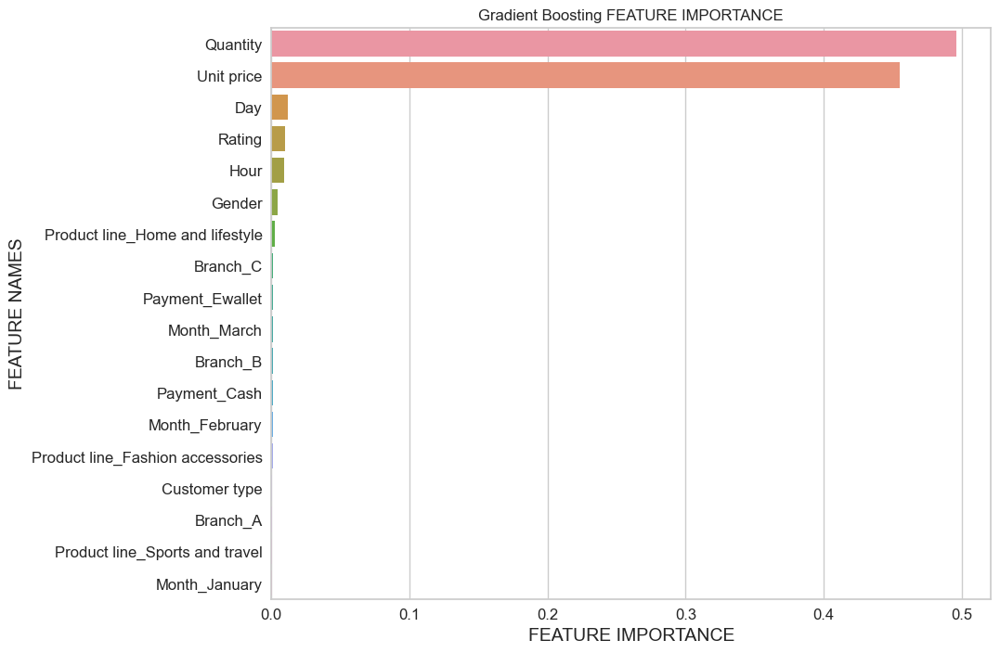

In [70]:
plot_feature_importance(gbt_result.best_estimator_.feature_importances_,X_train.columns,'Gradient Boosting ')


In [71]:
#Summary of scores

df = {'Models': ["Linear Regression","Random Forest Classifier","Gradient Boosting Classifier"],
     'MSE': [6474.63,163.21,113.29],
     'RMSE': [80.46,12.77,10.64],
     'MAE': [31.61,8.46,7.50]}
summary = pd.DataFrame(df)

In [72]:
summary

,Models,MSE,RMSE,MAE
0,Linear Regression,6474.63,80.46,31.61
1,Random Forest Classifier,163.21,12.77,8.46
2,Gradient Boosting Classifier,113.29,10.64,7.50


#### it was found that Gradient Boosting Model generated the minimum RMSE of 10.64 with optimal hyperparameters as compared to other models.It also has the lowest MSE and MAE scores which makes it a perfect model for prediction of sales.

In general, it shows that Quantity and Unit Price affects most the sales of this company. It means that people would buy more product if the price is affordable following what day it is and so on...



C:\Users\DWIGHT JIRO\AppData\Local\Temp\ipykernel_5312\1389070343.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  product_sales['Date_ordinal'] = product_sales['Date'].map(pd.Timestamp.toordinal)
C:\Users\DWIGHT JIRO\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
C:\Users\DWIGHT JIRO\AppData\Local\Temp\ipykernel_5312\1389070343.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prod

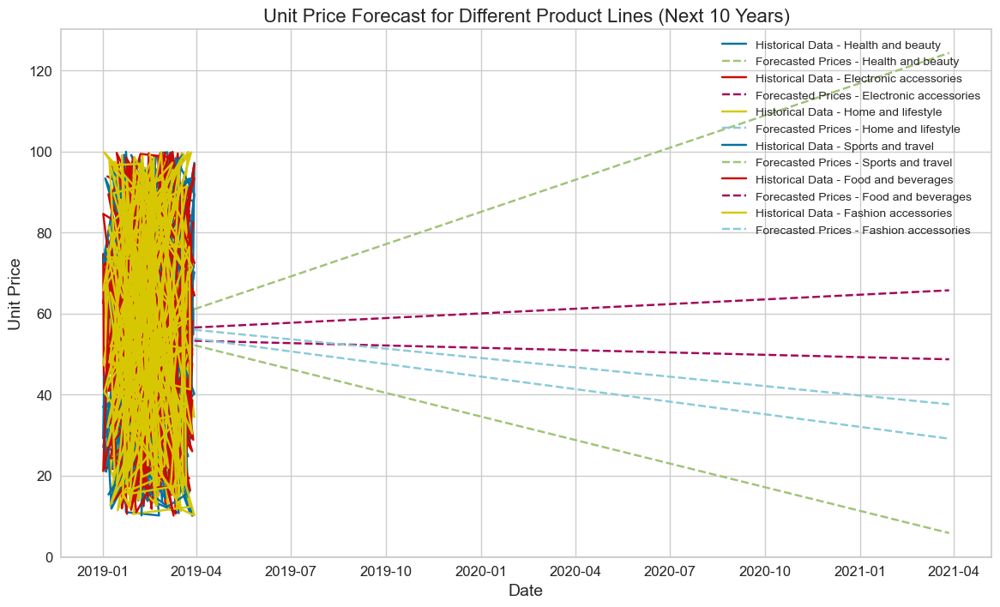

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

sales['Date'] = pd.to_datetime(sales['Date'])

sales = sales[['Date', 'Unit price', 'Product line']]

plt.figure(figsize=(14, 8))

product_lines = sales['Product line'].unique()

for product in product_lines:
    product_sales = sales[sales['Product line'] == product]
    
    product_sales['Date_ordinal'] = product_sales['Date'].map(pd.Timestamp.toordinal)
    
    X = product_sales[['Date_ordinal']]  
    y = product_sales['Unit price']  
    
    model = LinearRegression()
    model.fit(X, y)
    
    future_dates = pd.date_range(product_sales['Date'].max(), periods=730, freq='D')  # Future dates for 2 years
    future_dates_ordinal = future_dates.map(pd.Timestamp.toordinal)  # Convert future dates to ordinal format
    
    future_dates_ordinal = np.array(future_dates_ordinal).reshape(-1, 1)
    
    forecast_prices = model.predict(future_dates_ordinal)
    
    plt.plot(product_sales['Date'], product_sales['Unit price'], label=f'Historical Data - {product}')
    plt.plot(future_dates, forecast_prices, label=f'Forecasted Prices - {product}', linestyle='--')

plt.title('Unit Price Forecast for Different Product Lines (Next 10 Years)', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Unit Price')
plt.legend()
plt.grid(True)

